# **Edge Detection and Segmentation in Python**

In this notebook, you will learn how to detect the edges of an object within an image and segment said object using nothing but Python. Edge detection and Segmentation are useful when working in Computer Vision or Image Processing, and understanding what they are and how do them may serve you well if you wish to dive deeper into image processing. 

Let's first import our libraries; we will be using *pil* for image manipulation, and *matplotlib* for graphing.

In [1]:
from PIL import Image, ImageFilter
import matplotlib.pyplot as plt

Let's load an image and display it; I am going to use 'apple.jpg', an image within the same folder this notebook is in.

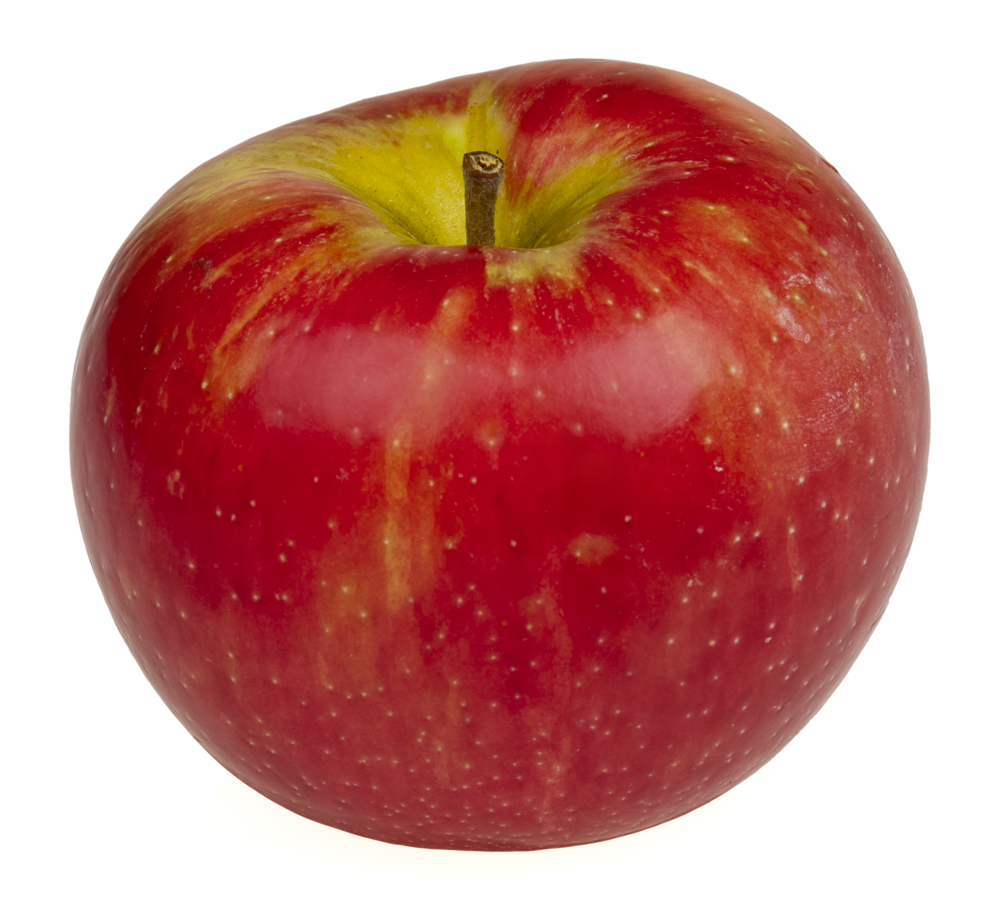

In [6]:
img_path = 'apple.jpg'
apple_image = Image.open(img_path)
apple_image

We can perform basic edge detection using the PIL libraries built-in filters; let's try one and see the result. 

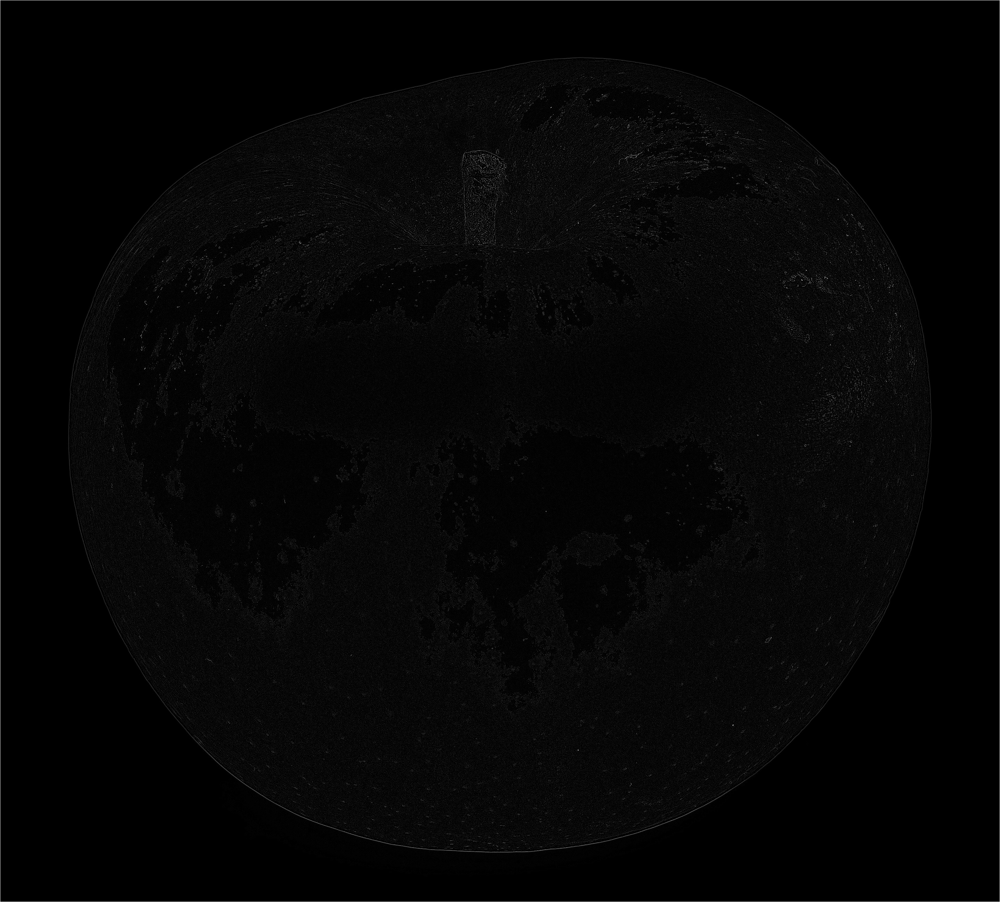

In [7]:
apple_edges = image.filter(ImageFilter.FIND_EDGES)
apple_edges

As you can see, the background has been excluded, and the edges of the apple have been outlined. 

We can also segment an object from an image. Let's create a grayscale version of the apple image and continue. 

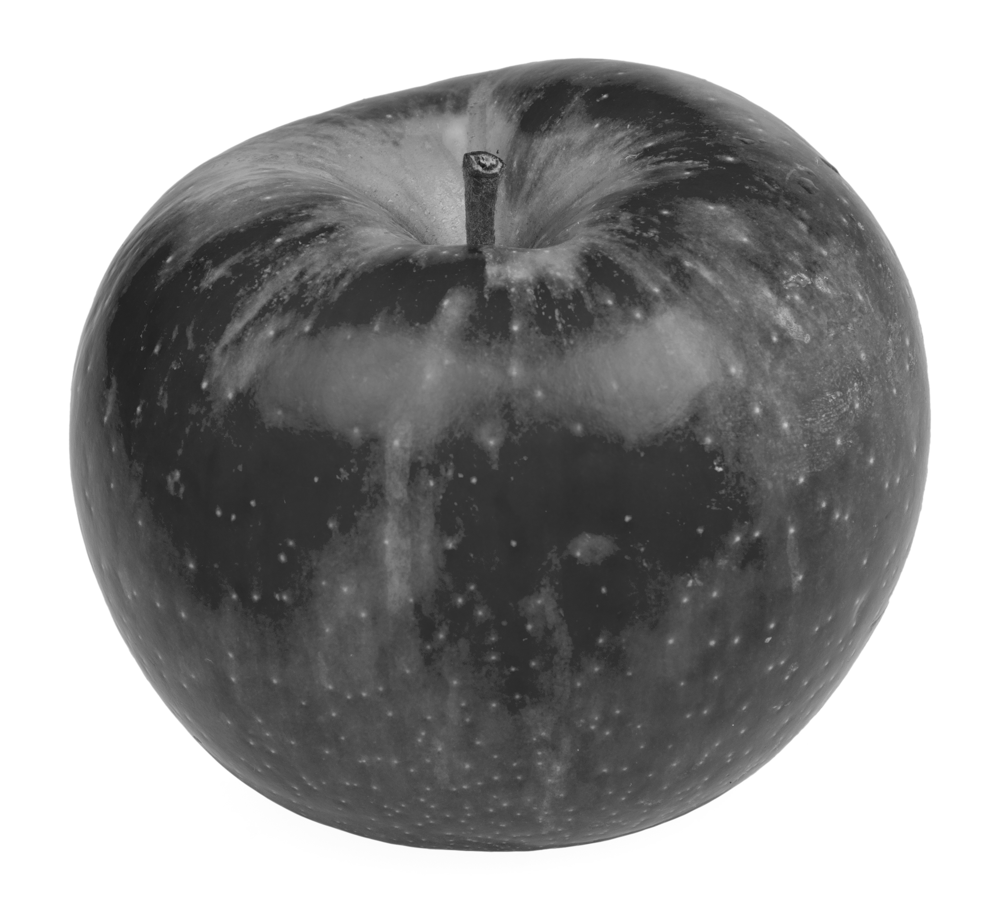

In [11]:
grey_apple = apple_image.convert('L')
grey_apple

We often begin segmentation with *thresholding* in which we convert a greyscale image into a binary image by setting a threshold value, where pixels above the threshold are assigned one value (usually white) and pixels below are assigned another value (usually black). Let's apply some thresholding and see the result. 

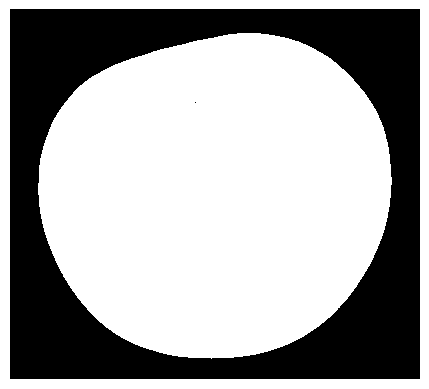

In [12]:
threshold = 200
image_threshold = grey_apple.point(lambda x: 0 if x > threshold else 255)

plt.figure()
plt.imshow(image_threshold, cmap='gray', interpolation='nearest')
plt.axis('off')
plt.show()

Next, we can perform some *erosion* and *dilation*. Erosion and dilation are morphological image processing techniques; erosion removes pixels on object boundaries to shrink regions of foreground pixels, while dilation adds pixels to the boundaries to expand regions of foreground pixels. Once we have done so, we can begin the segmentation process. 

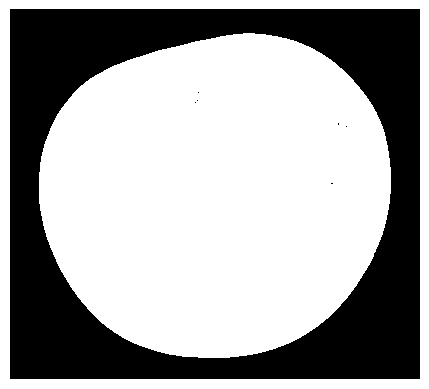

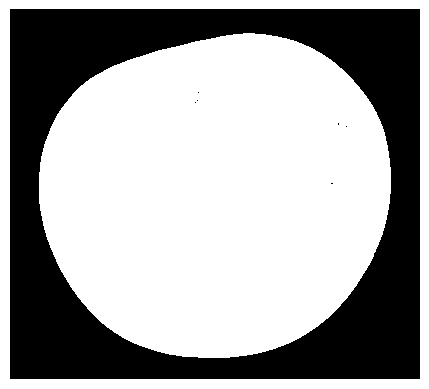

In [13]:
# Erosion and dilation 
def erode(image, cycles=1):
    for _ in range(cycles):
        image = image.filter(ImageFilter.MinFilter(3))
    return image

def dilate(image, cycles=1):
    for _ in range(cycles):
        image = image.filter(ImageFilter.MaxFilter(3))
    return image

# Segmentation 
eroded_image = erode(image_threshold, 3)
plt.figure()
plt.imshow(eroded_image, cmap='gray', interpolation='nearest')
plt.axis('off')
plt.show()

dilated_image = dilate(eroded_image, 0)
plt.figure()
plt.imshow(dilated_image, cmap='gray', interpolation='nearest')
plt.axis('off')
plt.show()

Finally, we can extract our segmented image from the original image. 

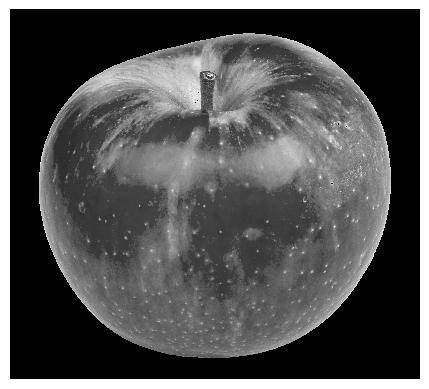

In [14]:
# extraction 
blank = grey_apple.point(lambda x: 0)
segmented_image = Image.composite(grey_apple, blank, dilated_image)
plt.figure()
plt.imshow(segmented_image, cmap='gray', interpolation='nearest')
plt.axis('off')
plt.show()

As you can see, we have successfully removed the background from the image, with only the apple remaining! 